# Pseudotime Trajectory Inference

Note: This picks up after the Joint Representation notebook

### Import Packages and Load Data

In [1]:
import mira
import anndata
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import warnings
warnings.simplefilter("ignore")
import random

umap_kwargs = dict(
    legend_fontweight=350, frameon = False, legend_fontsize=10
)

In [ ]:
#To start from beginning:
#Load Data and Topic Models

! cd /wynton/home/bruneau/jmuncie/MIRA_analysis/Mef2c
data_RNA = anndata.read_h5ad("Mef2c_RNA_AnnData.h5ad")
data_Peaks = anndata.read_h5ad("Mef2c_Peaks_AnnData.h5ad")

mef2c_exp_model = mira.topics.ExpressionTopicModel.load('models/Mef2c_RNA_ExpressionTopicModel.pth')
mef2c_atac_model = mira.topics.AccessibilityTopicModel.load('models/Mef2c_ATAC_TopicModel.pth')

In [2]:
#To resume with CM-V lineage, UMAPs made, topics predicted, etc.
data_sub_RNA = anndata.read_h5ad("Lineage_AnnData/Mef2c_CM-V_RNA_AnnData.h5ad")
data_sub_Peaks = anndata.read_h5ad("Lineage_AnnData/Mef2c_CM-V_Peaks_AnnData.h5ad")

mef2c_exp_model = mira.topics.ExpressionTopicModel.load('models/Mef2c_RNA_ExpressionTopicModel.pth')
mef2c_atac_model = mira.topics.AccessibilityTopicModel.load('models/Mef2c_ATAC_TopicModel.pth')

INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu
INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu


### Defining Pseudotime - CM-V lineage
### ---------------------------------------------------------------------------------------------------------------------------------


In [3]:
#Subset objects

data_sub_RNA = data_RNA[
    data_RNA.obs.Timepoint_x_Cell_Type.isin(
    ['E7.75_CMs/FHF', 
     'E8.5_CMs-V', 
     'E9_CMs-V'])
]

data_sub_Peaks = data_Peaks[
    data_RNA.obs.Timepoint_x_Cell_Type.isin(
    ['E7.75_CMs/FHF',
     'E8.5_CMs-V', 
     'E9_CMs-V'])
]

data_sub_RNA.obs.Timepoint_x_Cell_Type.unique()

['E7.75_CMs/FHF', 'E9_CMs-V', 'E8.5_CMs-V']
Categories (3, object): ['E7.75_CMs/FHF', 'E8.5_CMs-V', 'E9_CMs-V']

In [4]:
#Predict topics - note: topics models need to be loaded (near beginning of notebook)

mef2c_exp_model.predict(data_sub_RNA)
mef2c_atac_model.predict(data_sub_Peaks)

Predicting latent vars:   0%|          | 0/4 [00:00<?, ?it/s]

INFO:mira.adata_interface.core:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16, topic_17, topic_18, topic_19, topic_20, topic_21, topic_22, topic_23, topic_24, topic_25, topic_26, topic_27, topic_28, topic_29, topic_30, topic_31, topic_32
INFO:mira.adata_interface.core:Added key to varm: topic_feature_compositions
INFO:mira.adata_interface.core:Added key to varm: topic_feature_activations
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram


Predicting latent vars:   0%|          | 0/4 [00:00<?, ?it/s]

INFO:mira.adata_interface.core:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16
INFO:mira.adata_interface.core:Added key to varm: topic_feature_compositions
INFO:mira.adata_interface.core:Added key to varm: topic_feature_activations
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram


**Create UMAPs**  
Iterate over parameters

In [5]:
#Turn off logging to avoid being swamped with messages
mira.adata_interface.core.logger.setLevel(logging.WARN)
mira.adata_interface.topic_model.logger.setLevel(logging.WARN)
mira.adata_interface.utils.logger.setLevel(logging.WARN)

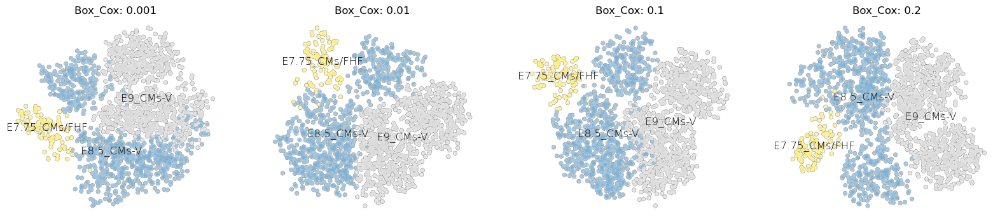

In [169]:
#Iterate over box_cox parameter, colored by cell type

def box_cox_test(ax, boxcox, rna, atac):
    
    mef2c_exp_model.get_umap_features(rna, box_cox=boxcox)
    mef2c_atac_model.get_umap_features(atac, box_cox=boxcox)

    rna, atac = mira.utils.make_joint_representation(rna, atac)

    sc.pp.neighbors(rna, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
    sc.tl.umap(rna, spread = 0.3, min_dist = 0.8, negative_sample_rate = 1)
    sc.pl.umap(rna, ax = ax, show = False, title = 'Box_Cox: ' + str(boxcox),
              color = 'Timepoint_x_Cell_Type', color_map = 'Set3', legend_loc='on data',
              add_outline=True, outline_width=(0.1,0), outline_color=('grey', 'white'),
              legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,4, figsize=(20,4))
for ax_i, boxcox in zip(ax, [0.001, 0.01, 0.1, 0.2]):
    box_cox_test(ax_i, boxcox, data_sub_RNA, data_sub_Peaks)

plt.show()

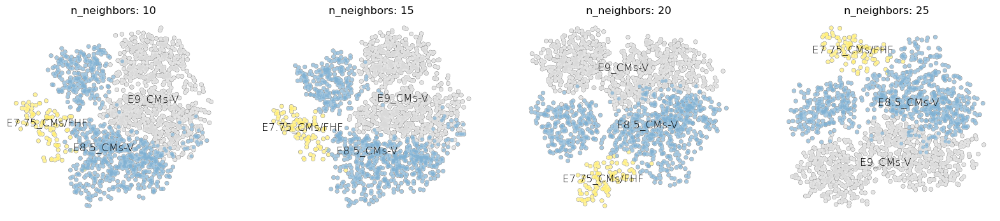

In [88]:
#Go with Box_Cox = 0.2
#Iterate over n_neighbors parameter, colored by cell type

def neighbors_test(ax, neighbors, rna, atac):

    mef2c_exp_model.get_umap_features(rna, box_cox=0.001)
    mef2c_atac_model.get_umap_features(atac, box_cox=0.001)
    
    rna, atac = mira.utils.make_joint_representation(rna, atac)

    sc.pp.neighbors(rna, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = neighbors)
    sc.tl.umap(rna, spread= 0.3, min_dist = 0.8, negative_sample_rate =1)
    sc.pl.umap(rna, ax = ax, show = False, title = 'n_neighbors: ' + str(neighbors),
              color = 'Timepoint_x_Cell_Type', color_map = 'Set3', legend_loc='on data',
              add_outline=True, outline_width=(0.1,0), outline_color=('grey', 'white'),
              legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,4, figsize=(20,4))
for ax_i, neighbors in zip(ax, [10,15,20,25]):
    neighbors_test(ax_i, neighbors, data_sub_RNA, data_sub_Peaks)

plt.show()

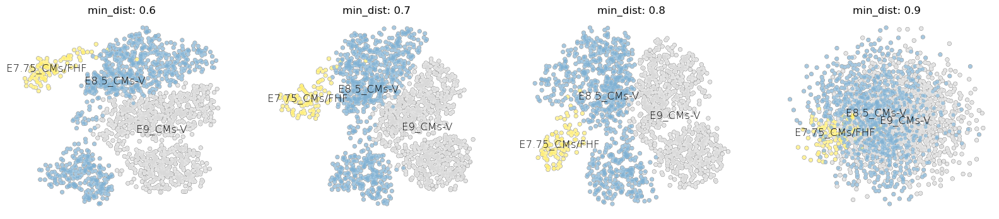

In [22]:
#Go with n_neighbors = 15
#Iterate over min_dist 
#Note: At this point, I also changed spread parameter from default of 1 to 0.3

def min_dist_test(ax, dist, rna, atac):

    mef2c_exp_model.get_umap_features(rna, box_cox=0.2)
    mef2c_atac_model.get_umap_features(atac, box_cox=0.2)
    
    rna, atac = mira.utils.make_joint_representation(rna, atac)

    sc.pp.neighbors(rna, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
    sc.tl.umap(rna, spread = 0.3, min_dist = dist, negative_sample_rate = 1)
    sc.pl.umap(rna, ax = ax, show = False, title = 'min_dist: ' + str(dist),
              color = 'Timepoint_x_Cell_Type', color_map = 'Set3', legend_loc='on data',
              add_outline=True, outline_width=(0.1,0), outline_color=('grey', 'white'),
              legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,4, figsize=(20,4))
for ax_i, dist in zip(ax, [0.6, 0.7, 0.8, 0.9]):
    min_dist_test(ax_i, dist, data_sub_RNA, data_sub_Peaks)

plt.show()

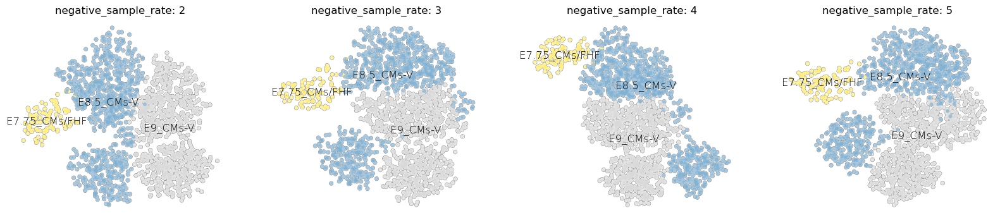

In [23]:
#Go with spread = 0.3 and min_dist = 0.8
#Iterate over negative_sample_rate

def neg_test(ax, neg_rate, rna, atac):
    
    mef2c_exp_model.get_umap_features(rna, box_cox=0.2)
    mef2c_atac_model.get_umap_features(atac, box_cox=0.2)

    rna, atac = mira.utils.make_joint_representation(rna, atac)

    sc.pp.neighbors(rna, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
    sc.tl.umap(rna, spread = 0.3, min_dist = 0.8, negative_sample_rate = neg_rate)
    sc.pl.umap(rna, ax = ax, show = False, title = 'negative_sample_rate: ' + str(neg_rate),
              color = 'Timepoint_x_Cell_Type', color_map = 'Set3', legend_loc='on data',
              add_outline=True, outline_width=(0.1,0), outline_color=('grey', 'white'),
              legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,4, figsize=(20,4))
for ax_i, neg_rate in zip(ax, [2, 3, 4, 5]):
    neg_test(ax_i, neg_rate, data_sub_RNA, data_sub_Peaks)

plt.show()

In [ ]:
#Just started manually adjusting boxcox, neighbors, spread, min_dist, and negative_sample_rate values

#Make finalized UMAP

mef2c_exp_model.get_umap_features(data_sub_RNA, box_cox=0.001)
mef2c_atac_model.get_umap_features(data_sub_Peaks, box_cox=0.001)

data_sub_RNA, data_sub_Peaks = mira.utils.make_joint_representation(
    data_sub_RNA, data_sub_Peaks)

sc.pp.neighbors(data_sub_RNA, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
sc.tl.umap(data_sub_RNA, spread = 0.3, min_dist = 0.8, negative_sample_rate = 1)

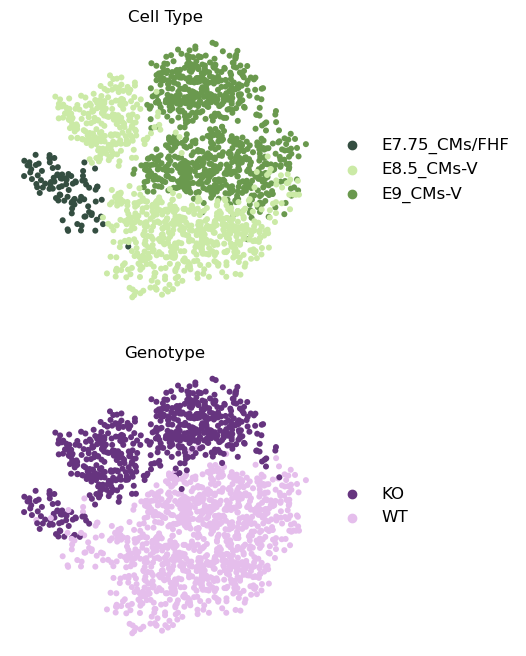

In [11]:
#Display UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = display_titles[display], size = 75,
              color = display_strings[display], palette = palettes[display], legend_loc='right margin',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(2,1, figsize=(4,8))
display_strings = ['Timepoint_x_Cell_Type', 'Genotype']
display_titles = ['Cell Type', 'Genotype']
celltype_colors = ['#344e41','#cbeaa6','#6a994e']
genotype_colors = ['#66347F', '#E5BEEC']
palettes = [celltype_colors, genotype_colors]
for ax_i, display in zip(ax, [0, 1]):
    display_fun(ax_i, display, data_sub_RNA)

#plt.savefig('plots/Mef2c_CM_V_UMAPs_celltype_genotype.pdf')
plt.show()

In [7]:
#First, calculate the diffusion map,
#then use mira.time.normalize_diffmap to rescale the components of the diffusion map
#This regularizes distortions in magnitude of the eigenvectors.

sc.tl.diffmap(data_sub_RNA)
mira.time.normalize_diffmap(data_sub_RNA)

INFO:root:Added key to obsm: X_diffmap, normalized diffmap with 14 components.
INFO:root:Added key to uns: eigen_gap


Recommending 4 diffusion map components.


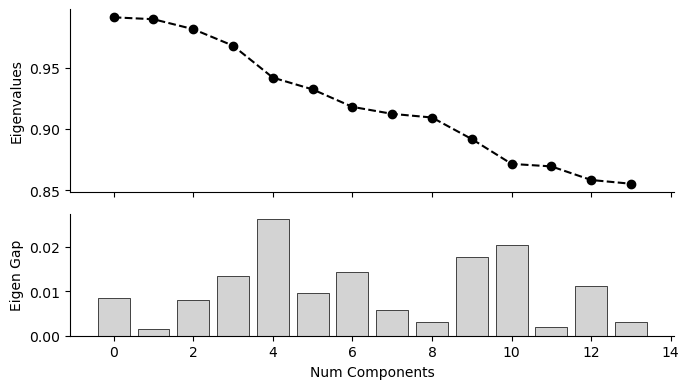

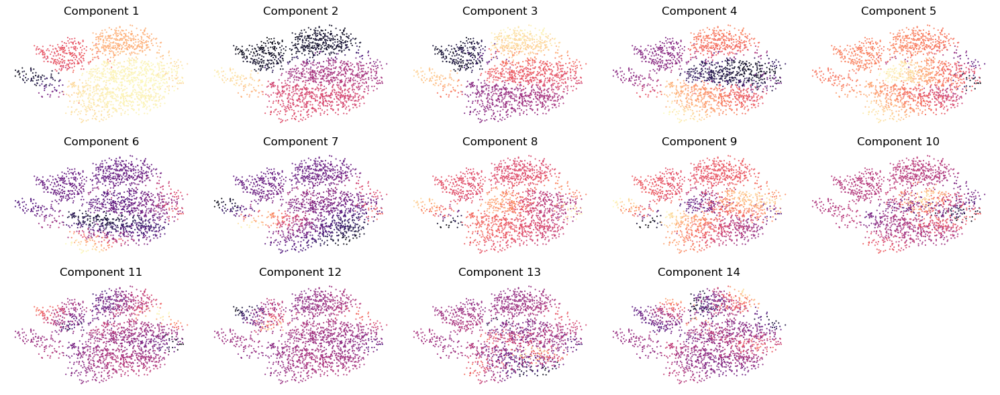

In [8]:
#Plot the Eigen_gap heuristic to ensure we select an appropriate number of components

mira.pl.plot_eigengap(data_sub_RNA, palette='magma')
plt.show()

In [19]:
#Next, we must define a new nearest-neighbors graph based on the diffusion components. 
#For sc.pp.neighbors, we indicate that we wish to calculate a new KNN graph using the first 
#__ components from data.obsm["X_diffmap"].

data_sub_RNA.obsm['X_diffmap'] = data_sub_RNA.obsm['X_diffmap'][:,:4] # subset the number of dimensions
sc.pp.neighbors(data_sub_RNA, use_rep='X_diffmap', key_added='X_diffmap')

In [20]:
#Now we check to make sure there are no disconnected components

mira.time.get_connected_components(data_sub_RNA)

INFO:mira.pseudotime.pseudotime:Found 1 components of KNN graph.


***Start with intial cell in E7.75 CM/FHF cluster***

In [160]:
#In order to create a pseudotime trajectory, we need to select a starting cell. For now, I will randomly 
#pick a random WT E7.75 CM/FHF cell 

cell_indices = data_sub_RNA.obs.index[
                    (data_sub_RNA.obs['Timepoint_x_Cell_Type'] == 'E7.75_CMs/FHF') &
                    (data_sub_RNA.obs['Genotype'] == 'KO')
                ]

print(random.choice(cell_indices))

sample02_CTCCTCACACTGGCTG-1


In [21]:
###ONCE THIS IS WORKING WELL - DO NOT CHANGE THIS STARTING CELL

#Now, we can assign cells a pseudotime and define a transport map describing a markov chain model 
#of forward differentiation using mira.time.get_transport_map

initial_cell = 'sample02_CTCCTCACACTGGCTG-1'
mira.time.get_transport_map(data_sub_RNA, start_cell= initial_cell)
###ONCE THIS IS WORKING WELL - DO NOT CHANGE THIS STARTING CELL

INFO:mira.pseudotime.pseudotime:Calculating inter-cell distances ...
INFO:root:Using 1 core. Speed this up by allocating more n_jobs.


Calculating pseudotime:   0%|          | 0/42825 [00:00<?, ?it/s]

INFO:mira.pseudotime.pseudotime:Calculating transport map ...
INFO:mira.adata_interface.pseudotime:Added key to obs: mira_pseudotime
INFO:mira.adata_interface.pseudotime:Added key to obsp: transport_map
INFO:mira.adata_interface.pseudotime:Added key to uns: start_cell


... storing 'mira_connected_components' as categorical


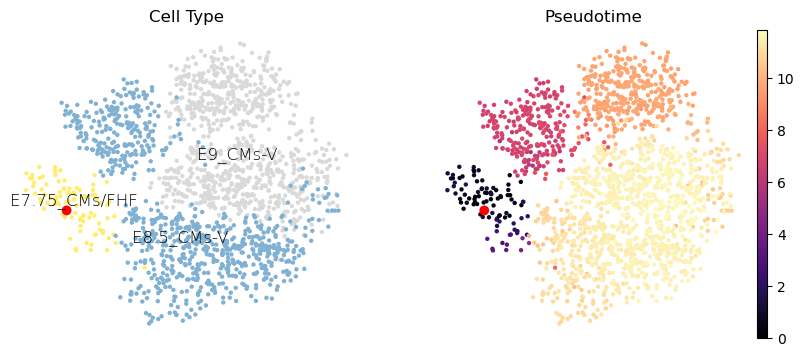

In [22]:
#Display pseudotime UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = display_titles[display], size = 40,
              color = display_strings[display], color_map = color_maps[display], legend_loc='on data',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
    #Show initial cell as red dot
    sc.pl.umap(data_sub_RNA[initial_cell], na_color = 'red', ax = ax,
          size = 200, title = display_titles[display], show=False)
    
fig, ax = plt.subplots(1,2, figsize=(10,4))
display_strings = ['Timepoint_x_Cell_Type', 'mira_pseudotime']
display_titles = ['Cell Type', 'Pseudotime']
color_maps = ['Set3', 'magma']
for ax_i, display in zip(ax, [0, 1]):
    display_fun(ax_i, display, data_sub_RNA)

plt.show()

INFO:mira.pseudotime.pseudotime:Found 1 terminal states from stationary distribution.


Terminal cells:  sample08_TTGTTTGGTGCCGCAA-1


<AxesSubplot:title={'center':'Terminal Cells'}, xlabel='UMAP1', ylabel='UMAP2'>

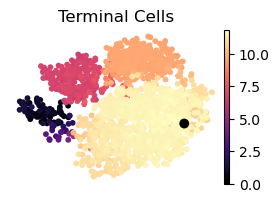

In [25]:
#Find terminal cells - "unbiased" MIRA method

#Default iterations and threshold parameters, for more terminal cells, increase number of iterations or threshold 
terminal_cells = mira.time.find_terminal_cells(data_sub_RNA, seed = 2, max_termini=1, iterations =1, threshold=1e-3)
print('Terminal cells: ', ', '.join(terminal_cells))

fig, ax = plt.subplots(1,1,figsize=(3,2))
sc.pl.umap(data_sub_RNA, color = 'mira_pseudotime', show = False,
           **umap_kwargs, color_map = 'magma', ax = ax)
sc.pl.umap(data_sub_RNA[terminal_cells], na_color = 'black', ax = ax,
          size = 200, title = 'Terminal Cells', show=False)

In [26]:
#Name terminal cells for states
terminal_cells_named = {
    'WT E9_CMs-V': 'sample08_TTGTTTGGTGCCGCAA-1'
}

### Optional - If you want to define terminal cells manually:

In [ ]:
#Define terminal cells - manually

cell_types = ['E9_CMs-V']

genotypes = ['WT', 'KO']

terminal_cells_man = []
terminal_cells_man_named = {}

for n in range(len(cell_types)*len(genotypes)):
    name = genotypes[n//1] + ' ' + cell_types[n % 1]
    cells = data_sub_RNA.obs.index[
                    (data_sub_RNA.obs['Timepoint_x_Cell_Type'] == cell_types[n % 1]) &
                    (data_sub_RNA.obs['Genotype'] == genotypes[n//1])
                ]
    term_cell = random.choice(cells)
    terminal_cells_man.append(term_cell)
    terminal_cells_man_named[name] = term_cell

print(terminal_cells_man)
print(terminal_cells_man_named)

In [ ]:
#Show manually selected terminal cells and initial cell on UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = '', size = 40,
              color = display_strings[display], color_map = color_maps[display], legend_loc='on data',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
    sc.pl.umap(data_sub_RNA[terminal_cells_man], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    sc.pl.umap(data_sub_RNA[initial_cell], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    fig = plt.gcf()
    title = fig.suptitle("Random Manual Terminal Cells", fontsize=12)

fig, ax = plt.subplots(1,2, figsize=(10,4))
display_strings = ['Timepoint_x_Cell_Type', 'mira_pseudotime']
color_maps = ['Set3', 'magma']

for ax_i, display in zip(ax, [0, 1]):
    display_fun(ax_i, display, data_sub_RNA)

plt.show()

Randomly picking cells and displaying on UMAP until finding cells I like for each group. Looking for cells that are near "median" space of cluster and towards end of pseudotime for that cluster

In [ ]:
terminal_cells_man = [
    'sample05_GTGTTCCTCACTAATG-1',
    'sample06_TCCATTGTCAGGAAGC-1'
]

terminal_cells_man_named = {
    'WT E9_CMs-V': 'sample05_GTGTTCCTCACTAATG-1',
    'KO E9_CMs-V': 'sample06_TCCATTGTCAGGAAGC-1'
}

#Show manually selected terminal cells and inital cell on UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = '', size = 40,
              color = display_strings[display], color_map = color_maps[display], legend_loc='on data',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
    sc.pl.umap(data_sub_RNA[terminal_cells_man], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    sc.pl.umap(data_sub_RNA[initial_cell], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    fig = plt.gcf()
    title = fig.suptitle("Manual Terminal Cells", fontsize=12)

fig, ax = plt.subplots(1,2, figsize=(10,4))
display_strings = ['Timepoint_x_Cell_Type', 'mira_pseudotime']
color_maps = ['Set3', 'magma']

for ax_i, display in zip(ax, [0, 1]):
    display_fun(ax_i, display, data_sub_RNA)

plt.show()

### Resume:

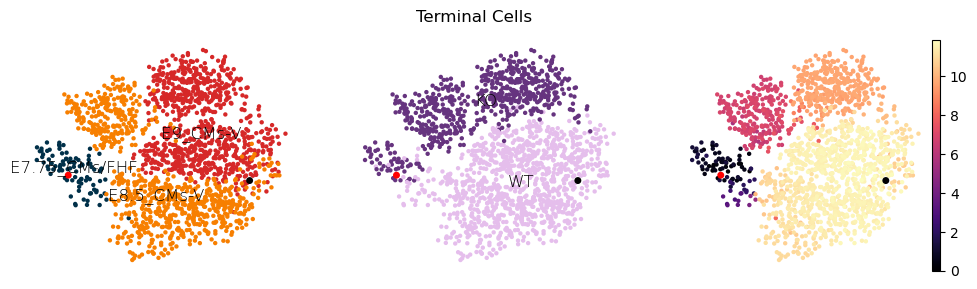

In [46]:
#Show terminal cells and inital cell on UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = '', size = 40,
              color = display_strings[display], color_map = color_maps[display], legend_loc='on data',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
    sc.pl.umap(data_sub_RNA[terminal_cells], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    sc.pl.umap(data_sub_RNA[initial_cell], na_color = 'red', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    fig = plt.gcf()
    title = fig.suptitle("Terminal Cells", fontsize=12)

fig, ax = plt.subplots(1,3, figsize=(12,3))
display_strings = ['Timepoint_x_Cell_Type', 'Genotype', 'mira_pseudotime']
color_maps = ['Set3', 'Set3', 'magma']

for ax_i, display in zip(ax, [0, 1, 2]):
    display_fun(ax_i, display, data_sub_RNA)

plt.show()

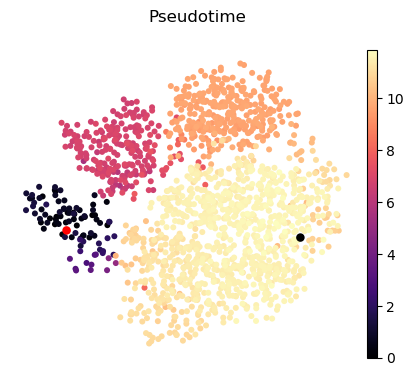

In [41]:
#Save pseudotime UMAP

fig, ax = plt.subplots(1,1, figsize=(5,4))
sc.pl.umap(data_sub_RNA, ax=ax, show = False, title = '', size = 75,
            color = 'mira_pseudotime', color_map = 'magma', legend_loc='right margin',
            add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
sc.pl.umap(data_sub_RNA[terminal_cells], ax=ax, na_color = 'black', legend_loc=None,
            size = 150, title = '', show=False)
sc.pl.umap(data_sub_RNA[initial_cell], ax=ax, na_color = 'red', legend_loc=None,
            size = 150, title = '', show=False)

fig = plt.gcf()
title = fig.suptitle("Pseudotime", fontsize=12)

plt.savefig('plots/Mef2c_CM_V_UMAPs_pseudotime.pdf')
plt.show()

In [30]:
#Find probability of reaching each terminal state

mira.time.get_branch_probabilities(data_sub_RNA, terminal_cells = terminal_cells_named)

INFO:mira.pseudotime.pseudotime:Simulating random walks ...
INFO:mira.adata_interface.pseudotime:Added key to obsm: branch_probs
INFO:mira.adata_interface.pseudotime:Added key to uns: lineage_names


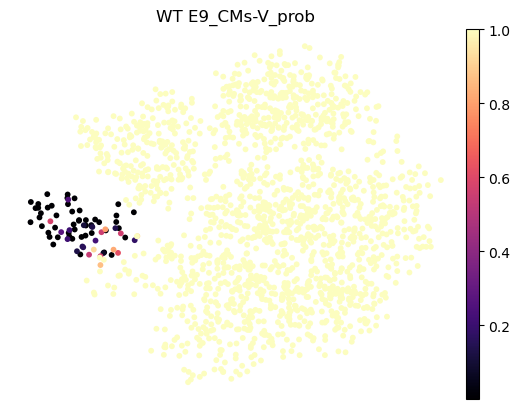

In [31]:
#Plot probabilites on UMAP

sc.pl.umap(data_sub_RNA,
   color = [x + '_prob' for x in data_sub_RNA.uns['lineage_names']],
   color_map='magma', **umap_kwargs)

INFO:mira.adata_interface.pseudotime:Added key to obs: tree_states
INFO:mira.adata_interface.pseudotime:Added key to uns: tree_state_names
INFO:mira.adata_interface.pseudotime:Added key to uns: connectivities_tree
... storing 'tree_states' as categorical


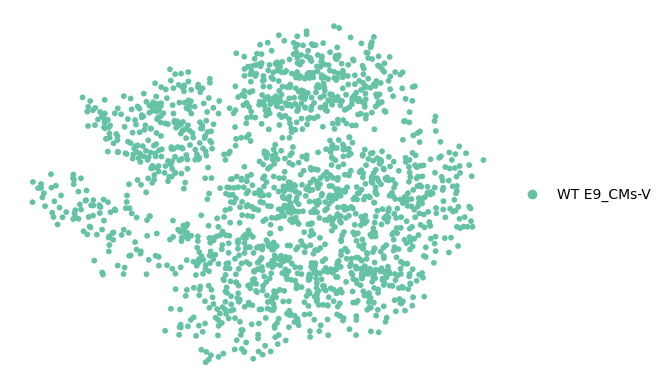

In [36]:
#Parse lineage probabilities to find bifurcating tree structure

mira.time.get_tree_structure(data_sub_RNA, threshold = 3)
sc.pl.umap(data_sub_RNA, color = 'tree_states', palette = 'Set2',
           **umap_kwargs, title = '', legend_loc='right margin')

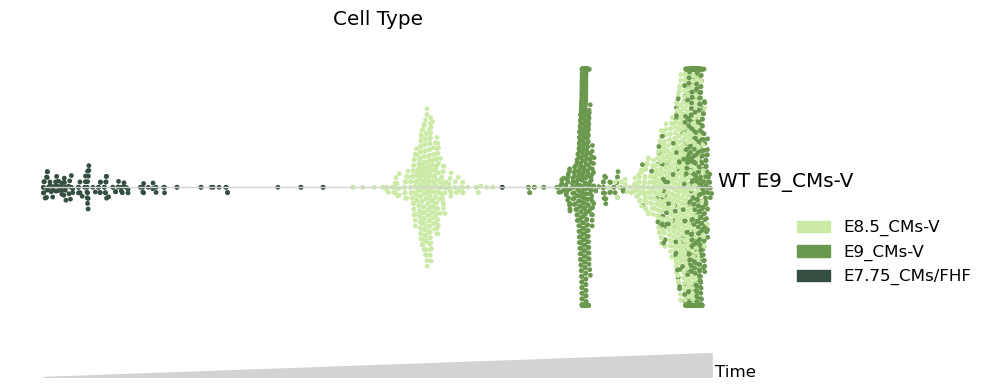

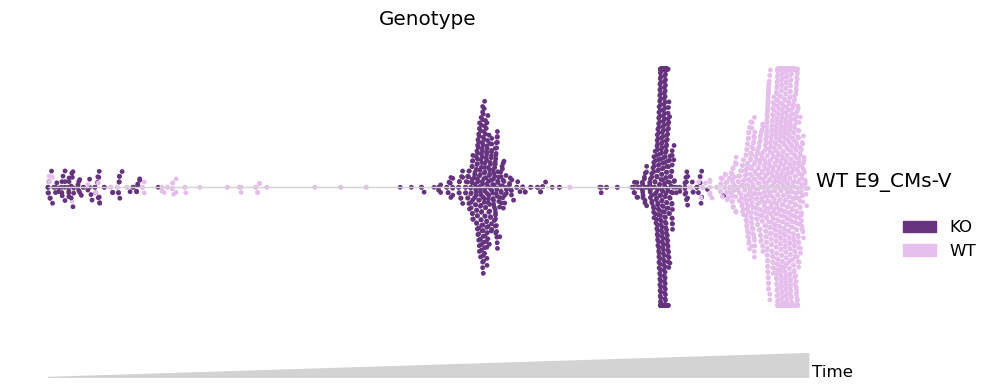

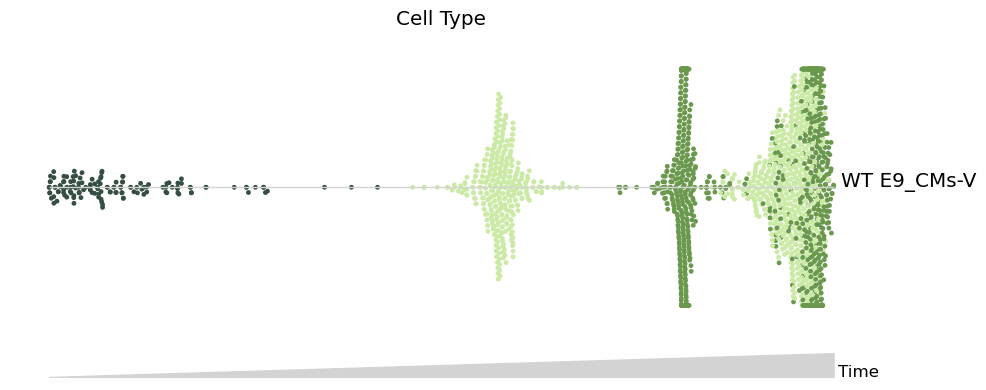

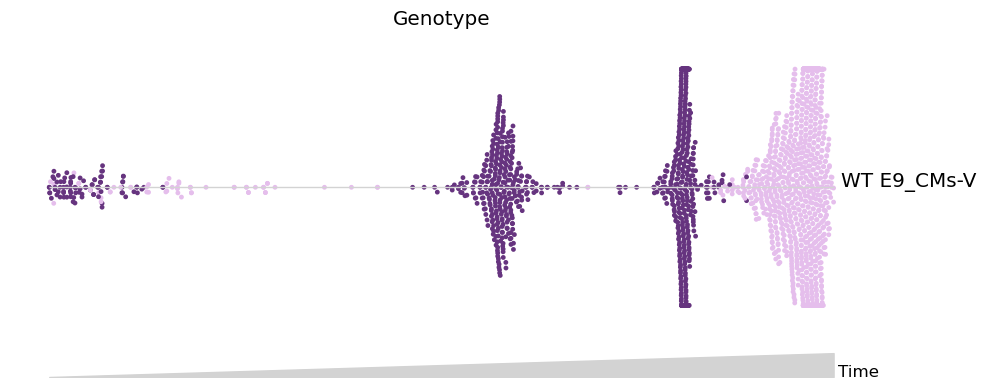

In [8]:
data_sub_RNA.obs.Timepoint_x_Cell_Type = data_sub_RNA.obs.Timepoint_x_Cell_Type.astype(str)
data_sub_RNA.obs.Genotype = data_sub_RNA.obs.Genotype.astype(str)

celltype_colors = ['#cbeaa6','#6a994e','#344e41']
genotype_colors = ['#66347F', '#E5BEEC']

def display_legends(display, data_obj):
    mira.pl.plot_stream(data_obj, 
                        data = display_strings[display], 
                        log_pseudotime=False, 
                        max_bar_height=0.99, 
                        title = display_titles[display],
                        style = 'swarm', 
                        palette = color_maps[display], 
                        size = 12, 
                        linewidth = 0,
                        figsize = (10,4),
                        max_swarm_density = 100,
                        show_legend = True,
                        legend_cols = 3)
    plt.savefig('plots/Mef2c_CM_V_streams_legends_' + display_save[display] + '.pdf')

def display_nolegends(display, data_obj):
    mira.pl.plot_stream(data_obj, 
                        data = display_strings[display], 
                        log_pseudotime=False, 
                        max_bar_height=0.99, 
                        title = display_titles[display],
                        style = 'swarm', 
                        palette = color_maps[display], 
                        size = 12, 
                        linewidth = 0,
                        figsize = (10,4),
                        max_swarm_density = 100,
                        show_legend = False)
    plt.savefig('plots/Mef2c_CM_V_streams_nolegends_' + display_save[display] + '.pdf')

display_strings = ['Timepoint_x_Cell_Type', 'Genotype']
display_titles = ['Cell Type', 'Genotype']
display_save = ['celltype', 'genotype']
color_maps = [celltype_colors, genotype_colors]

for display in [0, 1]:
    display_legends(display, data_sub_RNA)
    
for display in [0, 1]:
    display_nolegends(display, data_sub_RNA)

### Expression Topic Analysis

... storing 'Genotype' as categorical
... storing 'Timepoint_x_Cell_Type' as categorical


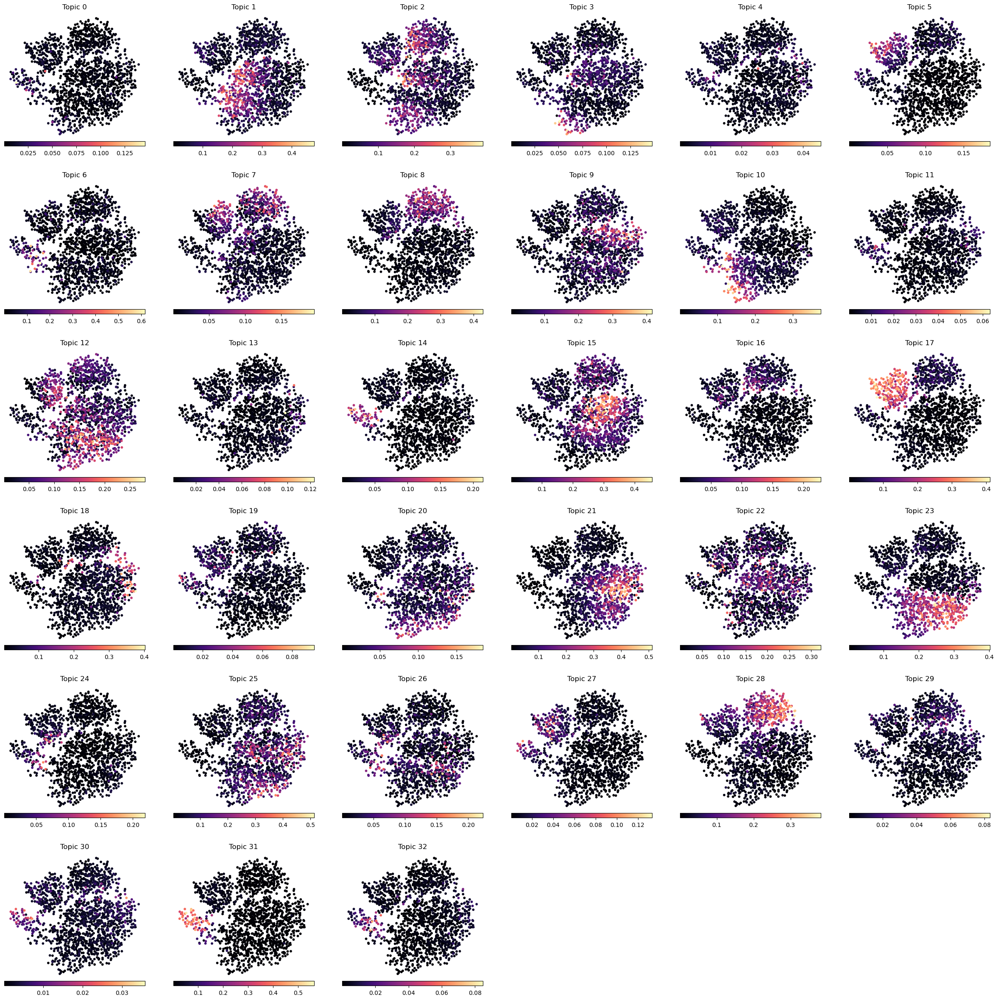

In [50]:
#Create a tiled UMAP montage to look at all expression topics 

#Plot titles
titles = [f"Topic {i}" for i in range(33)]

#And indexes for loop below
indexes = list(range(33))

def display_topics(ax, display, data):
    sc.pl.umap(data, ax = ax, show = False, title = '', colorbar_loc = 'bottom',
              color = f"topic_{display}", color_map = 'magma')
    ax.set_title(titles[display])

fig, ax = plt.subplots(6,6, figsize=(30,30))

for i, ax_i in enumerate(ax.flatten()):
    ax_i.axis('off')
    if i < len(indexes):
        display_topics(ax_i, indexes[i], data_sub_RNA)
        ax_i.set_title(titles[indexes[i]])

plt.show()

By inspecting these plots, we can see the following topics of interest:  

- E7.75 CMs/FHF: Topics 14, 30, 31*
- E8.5 KO and WT V: Topic 12
- E8.5 KO V: Topics 5, 7, 17*
- E9 KO V: Topics 2, 8, 28*
- E8.5 WT V: Topics 1, 23*
- E9 WT V: Topics 9, 15*, 21*, 25


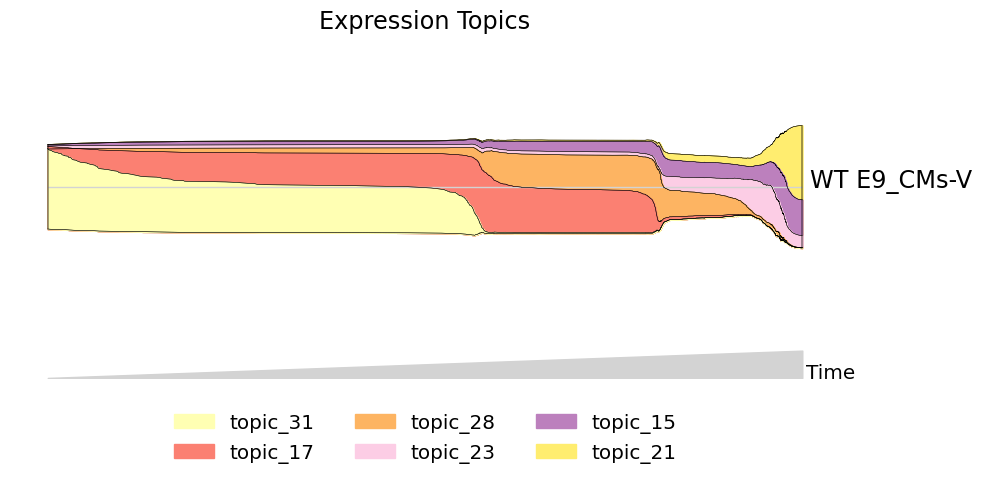

In [53]:
#Plot expression topics stream
plt.rcParams['font.size'] = 12
plot_kwargs = dict(hide_feature_threshold=0.03, linewidth=0.3, max_bar_height=0.8,
                    window_size=301, legend_cols=3, figsize = (10,5))

mira.pl.plot_stream(data_sub_RNA,
                    data = ['topic_' + str(i) for i in [15,17,21,23,28,31]],
                    title = 'Expression Topics',
                    order = 'ascending',
                    log_pseudotime=False, 
                    palette=sns.color_palette('Set3')[1::2], # warm tones
                    #palette = 'Set3',
                    **plot_kwargs)

plt.savefig('plots/Mef2c_CM_V_streams_exp_topics.pdf')

plt.show()

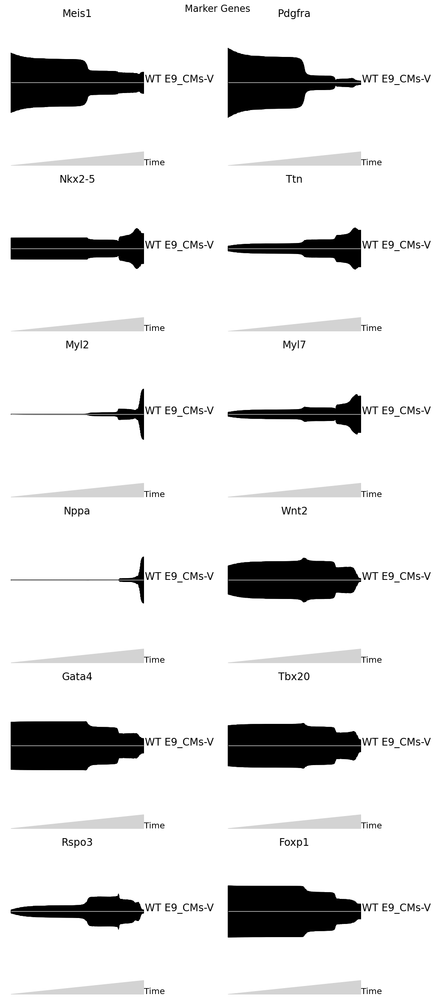

In [61]:
#Plot marker genes on the stream

#First, smooth the nomralized gene expression counts
data_sub_RNA.layers['smoothed'] = data_sub_RNA.obsp['connectivities'].dot(data_sub_RNA.layers['counts'])

#Stream plot
mira.pl.plot_stream(data_sub_RNA,
        data = ["Meis1", "Pdgfra", "Nkx2-5", "Ttn", "Myl2", "Myl7", "Nppa", "Wnt2", "Gata4", "Tbx20", "Rspo3", "Foxp1"], # multiple genes
        layers = 'smoothed', # plot KNN-smoothed values
        style = "stream",
        split = True, # split features into separate plots
        color = "black",  # "color" overrides "palette" when there is just one feature
        clip = 3,
        scale_features=True,
        plots_per_row=2, # how many plots, per row
        log_pseudotime = False, window_size = 301,
        title  = 'Marker Genes')
plt.savefig('plots/Mef2c_CM_V_streams_marker_genes.pdf')
plt.show()

In [69]:
#Get top genes from each topic
mef2c_exp_model.get_top_genes(17, top_n=50)

array(['Morrbid', 'Gm26693', 'Gpr18', 'Apaf1', 'Tbc1d32', 'Gm16083',
       'Entpd1', 'Ctsk', 'Spice1', 'Zfp949', 'Stxbp3', 'Mapk10',
       'Gm47272', 'Sept2', 'Dnah2', 'Acss3', 'Tktl1', 'Rb1', 'Dok6',
       'Slc22a17', 'Ccdc158', 'Gm42937', 'Gsta4', 'Pms1', 'Sesn1',
       'Syne2', 'Il15', 'Ccdc173', 'Hltf', 'Rbm41', 'Wwc2', 'Rnf32',
       'Cgnl1', 'C030032O16Rik', 'Dkk2', 'Gm11290', 'Zfp964', 'Bcap29',
       'Pcdhga5', 'Tnfaip8', 'Ppp1r16b', 'Tspan12', 'Sh3gl3', 'Sptbn4',
       'Ints6', 'Rufy3', 'Cemip2', 'Tjp1', 'Slc19a3', 'Slc15a2'],
      dtype=object)

**Let's use Enrichr to examine functional enrichments for topics of interest
.post_topic sends the top genes to Enrichr**

**Note: A good rule of thumb for setting top_n genes is to take the top 5% of genes 
modeled by the expression topic model. 
In my case, I modeled ~4000 genes, so I post the top 200 genes.**

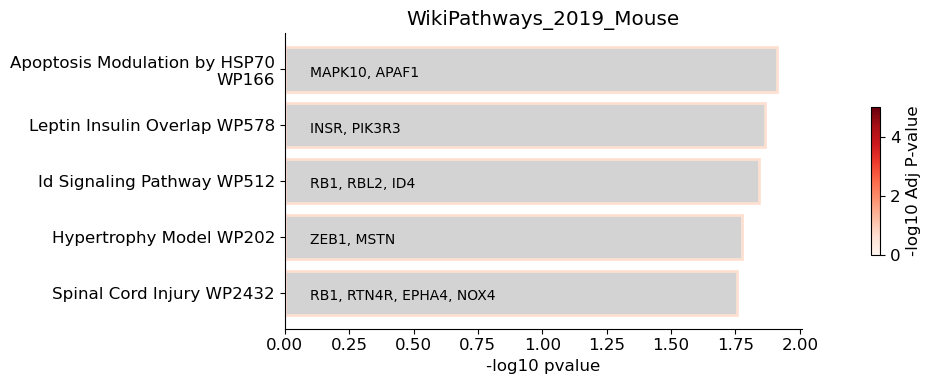

In [66]:
#Start with Topic 17: Enriched in E8.5 KO V CMs
mef2c_exp_model.post_topic(17, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(17, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(17, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

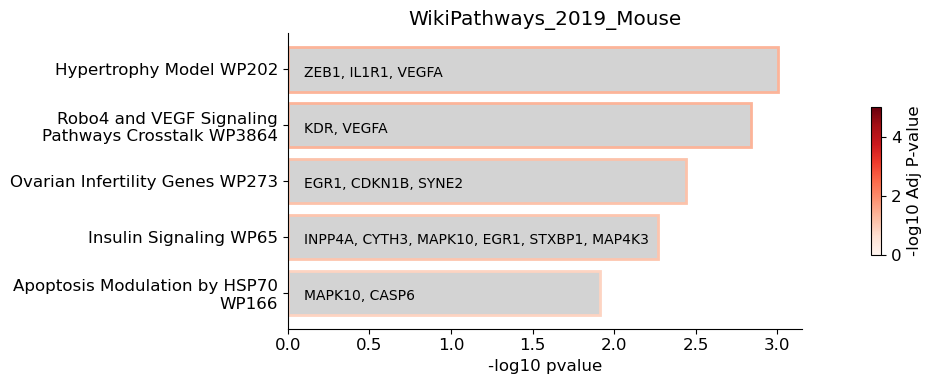

In [67]:
#Topic 28: Enriched in E9 KO V CMs
mef2c_exp_model.post_topic(28, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(28, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(28, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

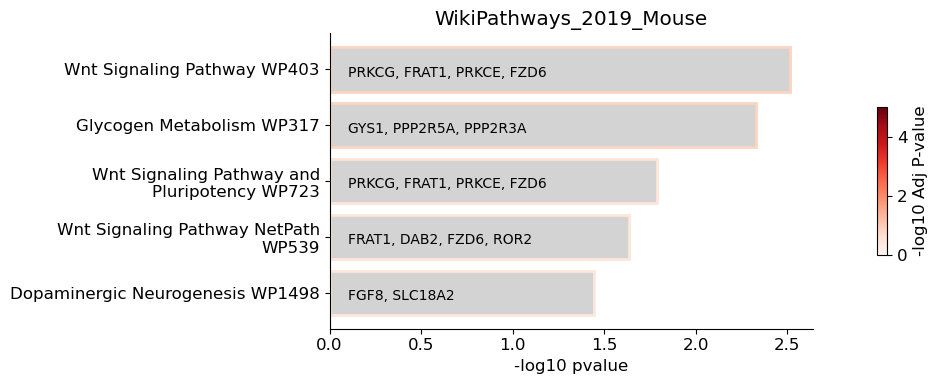

In [70]:
#Topic 23: Enriched in E8.5 WT V CMs
mef2c_exp_model.post_topic(23, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(23, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(23, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

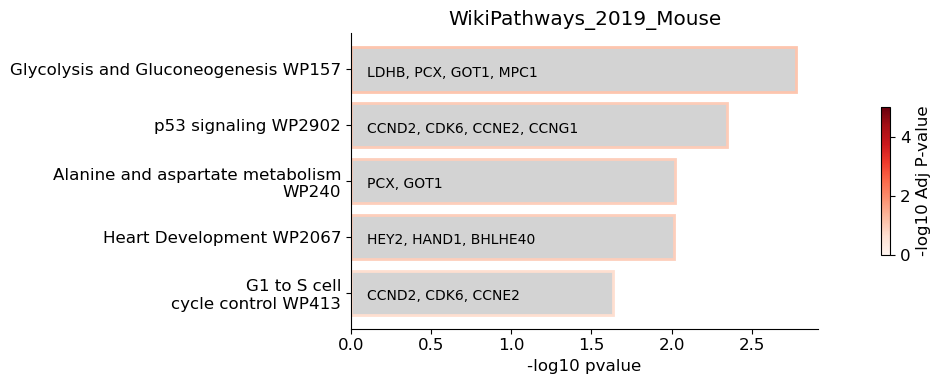

In [72]:
#Topic 15: Enriched in E9 WT V CMs
mef2c_exp_model.post_topic(15, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(15, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(15, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

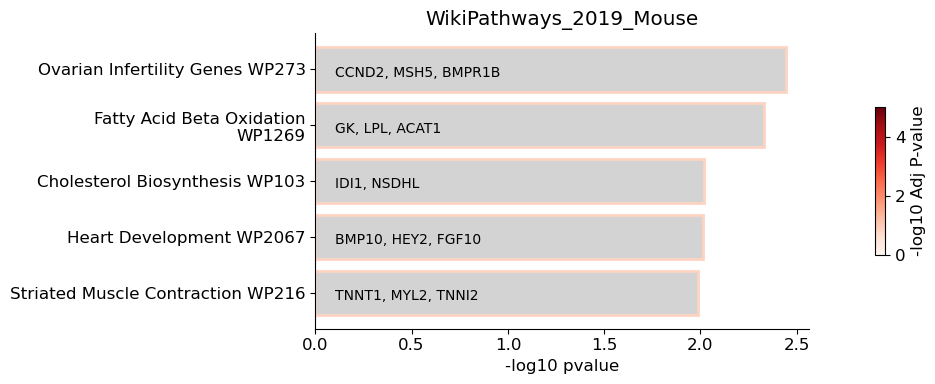

In [73]:
#Topic 21: Enriched in E9 WT V CMs
mef2c_exp_model.post_topic(21, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(21, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(21, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

### Accessibility Topic Analysis 

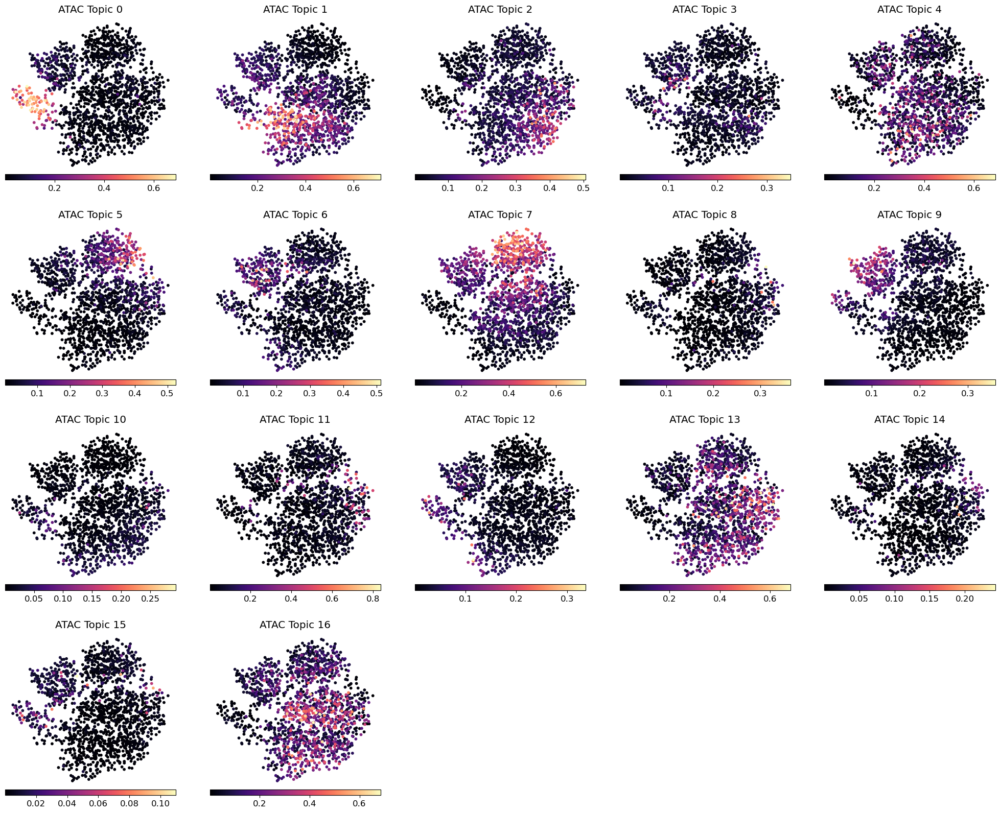

In [74]:
#Create a tiled UMAP montage to look at all accessibility topics 

#Plot titles
titles = [f"ATAC Topic {i}" for i in range(17)]

#And indexes for loop below
indexes = list(range(17))

def display_topics(ax, display, data):
    sc.pl.umap(data, ax = ax, show = False, title = '', colorbar_loc = 'bottom',
              color = f"ATAC_topic_{display}", color_map = 'magma')
    ax.set_title(titles[display])

fig, ax = plt.subplots(4,5, figsize=(25,20))

for i, ax_i in enumerate(ax.flatten()):
    ax_i.axis('off')
    if i < len(indexes):
        display_topics(ax_i, indexes[i], data_sub_RNA)
        ax_i.set_title(titles[indexes[i]])

plt.show()

By inspecting these plots, we can see the following topics of interest:  

- E7.75 CMs/FHF: Topics 0*
- E8.5 KO V: Topics 6, 9*
- E9 KO V: Topics 5, 7*
- E8.5 WT V: Topics 1*, 2, 4
- E9 WT V: Topics 13*, 16*

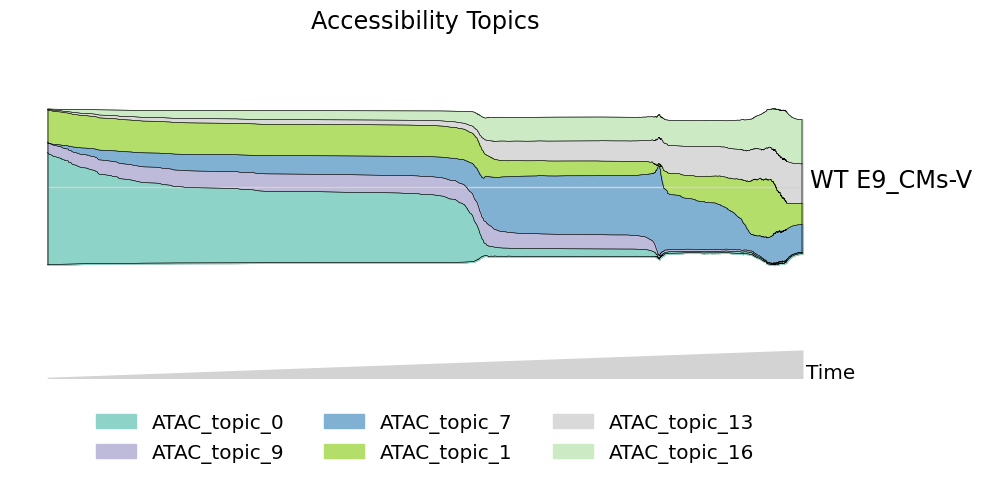

In [76]:
#Plot accessibility topics stream
plt.rcParams['font.size'] = 12
plot_kwargs = dict(hide_feature_threshold=0.03, linewidth=0.3, max_bar_height=0.8,
                    window_size=301, legend_cols=3, figsize = (10,5))

mira.pl.plot_stream(data_sub_RNA,
                    data = ['ATAC_topic_' + str(i) for i in [0,1,7,9,13,16]],
                    title = 'Accessibility Topics',
                    order = 'ascending',
                    log_pseudotime=False, 
                    palette=sns.color_palette('Set3')[::2], # cool tones
                    #palette = 'Set3',
                    **plot_kwargs)

plt.savefig('plots/Mef2c_CM_V_streams_atac_topics.pdf')

plt.show()

In [77]:
#Save subset AnnData objects
data_sub_RNA.write_h5ad(filename="Lineage_AnnData/Mef2c_CM-V_RNA_AnnData.h5ad")
data_sub_Peaks.write_h5ad(filename="Lineage_AnnData/Mef2c_CM-V_Peaks_AnnData.h5ad")